In [26]:
import aFunctions
from importlib import reload
from statsmodels.formula.api import ols, logit
from statsmodels.api import add_constant
from sklearn.linear_model import LogisticRegression, LinearRegression
from sklearn.metrics import r2_score
from aFunctions import *
init_notebook_mode(connected=True)

# Workbook Summary:

- Perform Time Series Statistical Stationarity Tests & ACF / PACF Tests
- Explore Indicators & Plot Indicators
- Plot a series of technical signals and test on Absolute Returns & Relative Returns
- Fit Basic Models for Train/Test Sets, with the preview of our subsiquent notebook that will focus on feature selection & importance

In [2]:
tickers = np.array(['SPY', 'XLY', 'XLP', 'XLE', 'XLF', 'XLV', 'XLI', 'XLB', 'XLK', 'XLU'])

In [3]:
start_date = datetime(2004,1,1)
end_date = datetime.today()
df = GetMkt(tickers, start_date, end_date, freq = 'daily', bmark_tick = 'SPY')
df['date'] = pd.to_datetime(df['date'])

SPY (3928, 20) 2004-01-02 00:00:00
XLY (3928, 20) 2004-01-02 00:00:00
XLP (3928, 20) 2004-01-02 00:00:00
XLE (3928, 20) 2004-01-02 00:00:00
XLF (3928, 20) 2004-01-02 00:00:00
XLV (3928, 20) 2004-01-02 00:00:00
XLI (3928, 20) 2004-01-02 00:00:00
XLB (3928, 20) 2004-01-02 00:00:00
XLK (3928, 20) 2004-01-02 00:00:00
XLU (3928, 20) 2004-01-02 00:00:00
(39280, 20) 2019-08-09 00:00:00 2004-01-02 00:00:00


In [4]:
list(df.columns)

['adjClose',
 'adjHigh',
 'adjLow',
 'adjOpen',
 'adjVolume',
 'close',
 'creturns',
 'date',
 'divCash',
 'high',
 'index',
 'low',
 'open',
 'preturns',
 'rreturns',
 'rreturns-d',
 'splitFactor',
 'tcreturns',
 'ticker',
 'volume']

In [5]:
for column in df:
    if df[column].isnull().any():
        print('{0} has {1} null values'.format(column, df[column].isnull().sum()))

Text(0.5, 1.0, 'Daily Relative Returns')

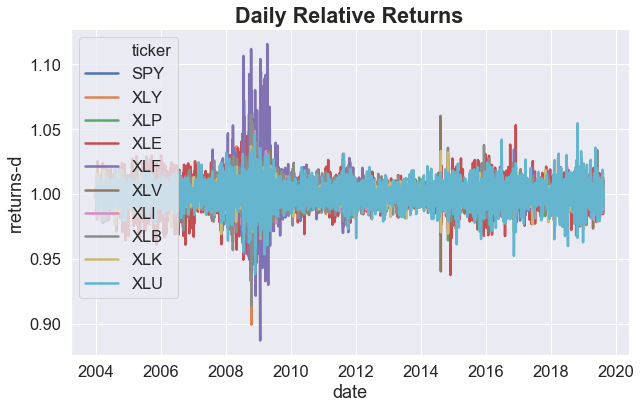

In [7]:
sns.set_style("darkgrid")
sns.set(rc={'figure.figsize':(10,6)})
sns.set_context("notebook", font_scale=1.5, rc={"lines.linewidth": 2.5})
snslp = sns.lineplot(x='date', y='rreturns-d',
                     hue="ticker",
                     data=df)
plt.title("Daily Relative Returns", weight='bold', size = 'large')

Text(0.5, 1.0, 'Close Adjusted Prices')

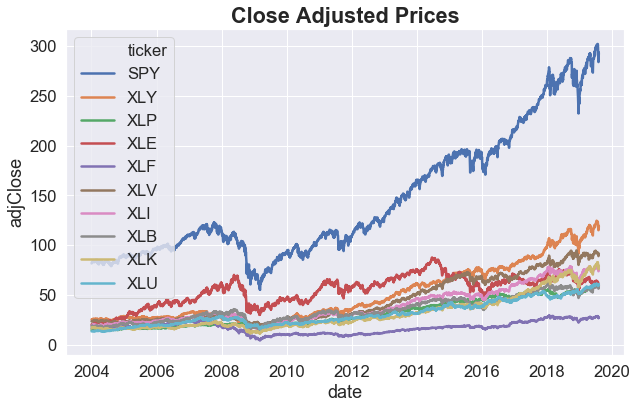

In [12]:
snslp = sns.lineplot(x='date', y='adjClose',
             hue="ticker",
             data=df)

plt.title("Close Adjusted Prices", weight='bold', size = 'large')

Text(0.5, 1.0, 'Absolute Returns')

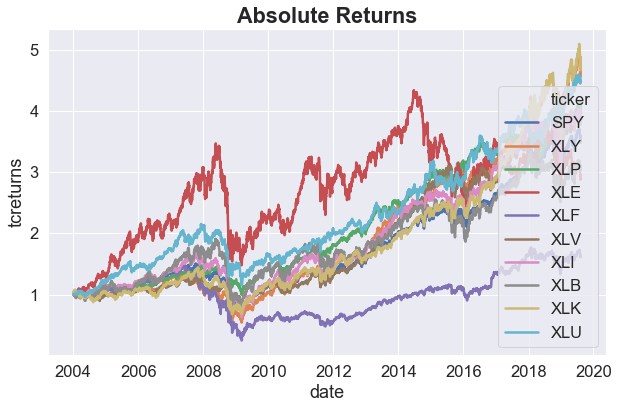

In [10]:
snslp = sns.lineplot(x='date', y='tcreturns',
             hue="ticker",
             data=df)

plt.title("Absolute Returns", weight='bold', size = 'large')

Text(0.5, 1.0, 'Rel to SPY Returns')

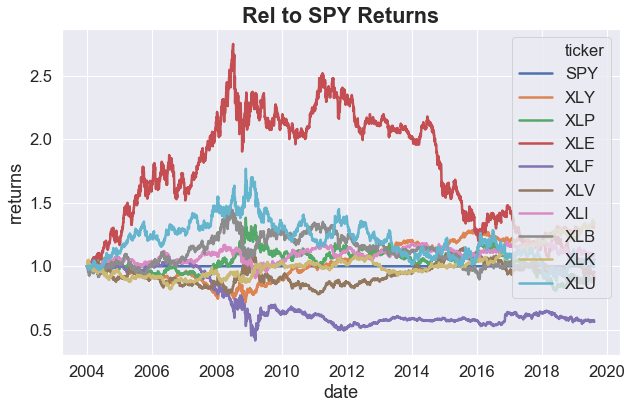

In [14]:
snslp = sns.lineplot(x='date', y='rreturns',
             hue="ticker",
             data=df)

plt.title("Rel to SPY Returns", weight='bold', size = 'large')

# ADF tests on Weekly Returns:

- Results on price or timeseries of Cumulative returns
- Results on weekly absolute returns
- weekly relative returns to SPY
- weekly cummulative relative returns

In [15]:
list(df.columns)

['adjClose',
 'adjHigh',
 'adjLow',
 'adjOpen',
 'adjVolume',
 'close',
 'creturns',
 'date',
 'divCash',
 'high',
 'index',
 'low',
 'open',
 'preturns',
 'rreturns',
 'rreturns-d',
 'splitFactor',
 'tcreturns',
 'ticker',
 'volume']

In [16]:
adf = pd.DataFrame([], index = ['ADF', 'pval', 'ulag', 'n', 'cval'])

#t[3].resols.summary()
for i in tickers[:]:
    c = df[df['ticker'] == i]['tcreturns']
    t = list(adfuller(c, maxlag=1, regression='c', autolag = None, regresults=False))
    adf[i+' - Price'] = t[:5]
    c = df[df['ticker'] == i]['creturns']
    t = list(adfuller(c, maxlag=1, regression='c', autolag = None, regresults=False))
    adf[i+' - Absolute'] = t[:5]
    if i =='SPY':
        continue
    c = df[df['ticker'] == i]['rreturns-d']
    t = list(adfuller(c, maxlag=1, regression='c', autolag = None, regresults=False))
    adf[i+' - Relative'] = t[:5]
    c = df[df['ticker'] == i]['rreturns']
    t = list(adfuller(c, maxlag=1, regression='c', autolag = None, regresults=False))
    adf[i+' - CIX'] = t[:5]
    
adf = adf.T
adf['1%'] = np.round(adf['cval'][0]['1%'],3)
adf['5%'] = np.round(adf['cval'][1]['5%'],3)
adf['10%'] = np.round(adf['cval'][2]['10%'],3)
print('ADF Test Results on Weekly Returns:')
adf.drop('cval', axis=1)

ADF Test Results on Weekly Returns:


,ADF,pval,ulag,n,1%,5%,10%
SPY - Price,0.891948,0.992984,1,3926,-3.432,-2.862,-2.567
SPY - Absolute,-49.6347,0,1,3926,-3.432,-2.862,-2.567
XLY - Price,1.38967,0.997067,1,3926,-3.432,-2.862,-2.567
XLY - Absolute,-46.4376,0,1,3926,-3.432,-2.862,-2.567
XLY - Relative,-48.7243,0,1,3926,-3.432,-2.862,-2.567
XLY - CIX,-0.28446,0.927677,1,3926,-3.432,-2.862,-2.567
XLP - Price,0.647904,0.988739,1,3926,-3.432,-2.862,-2.567
XLP - Absolute,-49.511,0,1,3926,-3.432,-2.862,-2.567
XLP - Relative,-47.7504,0,1,3926,-3.432,-2.862,-2.567
XLP - CIX,-2.29826,0.172531,1,3926,-3.432,-2.862,-2.567


# Degree of Differentiation Required for stationarity

- We can take price and use fractional differentiation to create a new time series (De Prado 2018)
- This can be done on both Price & Relative Price (CIX) to use in modeling
- Below to find the threshold for differentiation for Price Returns & rerun ADF tests
- This amounts to a mean reverting feature, in this case we use daily return inputs

In [39]:
reload(aFunctions)
from aFunctions import *
df.index = df['date']

In [42]:
FFD_cutoff = pd.DataFrame([])
tickers = np.array(['XLY', 'XLP', 'XLE', 'XLF', 'XLV', 'XLI', 'XLB', 'XLK', 'XLU'])
for i in tickers:
    o = plotMinFFD(df[df['ticker'] == i]['rreturns']) 
    o['ticker'] = i
    FFD_cutoff = FFD_cutoff.append(o, ignore_index=True)
FFD_cutoff.head()

,adfStat,pVal,lags,nObs,95% conf,corr,Diff,ticker
0,-0.284460,0.927677,1.0,3926.0,-2.862276,1.000000,0.0,XLY
1,-0.632712,0.863418,1.0,3919.0,-2.862278,0.999928,0.1,XLY
2,-1.219973,0.664945,1.0,3916.0,-2.862278,0.999416,0.2,XLY
3,-1.980432,0.295218,1.0,3915.0,-2.862279,0.997867,0.3,XLY
4,-2.927066,0.042290,1.0,3916.0,-2.862278,0.994731,0.4,XLY


In [43]:
FFD_cutoff.to_csv('FWW-FD-relReturns-cutoffs-d.csv')

In [45]:
FFD_cutoff[np.round(FFD_cutoff['Diff'],2) == .4]

,adfStat,pVal,lags,nObs,95% conf,corr,Diff,ticker
4,-2.927066,4.228988e-02,1.0,3916.0,-2.862278,0.994731,0.4,XLY
15,-7.772670,8.835673e-12,1.0,3916.0,-2.862278,0.967876,0.4,XLP
26,-4.254130,5.328644e-04,1.0,3916.0,-2.862278,0.990380,0.4,XLE
37,-3.529083,7.270844e-03,1.0,3916.0,-2.862278,0.993604,0.4,XLF
48,-7.535362,3.490021e-11,1.0,3916.0,-2.862278,0.970144,0.4,XLV
59,-8.955573,8.492497e-15,1.0,3916.0,-2.862278,0.956710,0.4,XLI
70,-6.513235,1.087209e-08,1.0,3916.0,-2.862278,0.976848,0.4,XLB
81,-4.069110,1.088872e-03,1.0,3916.0,-2.862278,0.989370,0.4,XLK
92,-6.880264,1.439464e-09,1.0,3916.0,-2.862278,0.973529,0.4,XLU


In [47]:
c = 0
t = 1e-2
FFD_df = pd.DataFrame([])
print('Fractional feature, ADF test results post transformation (All Data, 2010+, 2015+)')
for i in tickers:
    ff = fracDiff_FFD(df[df['ticker'] == i]['rreturns'],
                      .4,
                      thres=1e-2).to_frame()
    ff['ticker'] = i
    FFD_df = FFD_df.append(ff)
    print(i, ff.shape)
    print('ADF Test Stat', 
          np.round(list(adfuller(ff['rreturns'], maxlag=1, 
                                 regression='c', autolag = None))[0],2),
          np.round(list(adfuller(ff.loc[ff.index > datetime(2010, 1, 1)]['rreturns'], 
                                 maxlag=1, regression='c', autolag = None))[0],2),
          np.round(list(adfuller(ff.loc[ff.index > datetime(2015, 1, 1)]['rreturns'], 
                                 maxlag=1, regression='c', autolag = None))[0],2))
    c+= 1
    
FFD_df = FFD_df.rename(columns={"rreturns": "MeanRev-FF"})
FFD_df['date'] = FFD_df.index

Fractional feature, ADF test results post transformation (All Data, 2010+, 2015+)
XLY (3918, 2)
ADF Test Stat -2.93 -3.75 -5.83
XLP (3918, 2)
ADF Test Stat -7.77 -5.09 -3.04
XLE (3918, 2)
ADF Test Stat -4.25 -2.02 -3.46
XLF (3918, 2)
ADF Test Stat -3.53 -6.79 -5.51
XLV (3918, 2)
ADF Test Stat -7.54 -4.49 -4.79
XLI (3918, 2)
ADF Test Stat -8.96 -9.72 -6.74
XLB (3918, 2)
ADF Test Stat -6.51 -4.03 -4.81
XLK (3918, 2)
ADF Test Stat -4.07 -2.96 -2.52
XLU (3918, 2)
ADF Test Stat -6.88 -6.37 -6.58


In [150]:
c = 0
t = 1e-2
FFD_df = pd.DataFrame([])
print('Rel Fractional feature, ADF test results post transformation (All Data, 2010+, 2015+)')
FFD_c = [0.5,0.2,.5,.5]
for i in tickers[1:]:
    ff = fracDiff_FFD(df[df['ticker'] == i]['RelccRtn'].cumsum(),
                      FFD_c[c],
                      thres=t).to_frame()
    ff['ticker'] = i
    FFD_df = FFD_df.append(ff)
    print(i, ff.shape)
    print('ADF Test Stat', 
          np.round(list(adfuller(ff['RelccRtn'], maxlag=1, regression='c', autolag = None))[0],2),
          np.round(list(adfuller(ff.loc[ff.index > datetime(2010, 1, 1)]['RelccRtn'], 
                                 maxlag=1, 
                                 regression='c', 
                                 autolag = None))[0],2),
          np.round(list(adfuller(ff.loc[ff.index > datetime(2015, 1, 1)]['RelccRtn'], 
                                 maxlag=1, 
                                 regression='c', 
                                 autolag = None))[0],2))
    c+= 1
    
FFD_df = FFD_df.rename(columns={"RelccRtn": "MeanRev-FF"})
FFD_df['date'] = FFD_df.index

Rel Fractional feature, ADF test results post transformation (All Data, 2010+, 2015+)
QQQ (3390, 2)
ADF Test Stat -3.72 -4.1 -4.84
IWM (3389, 2)
ADF Test Stat -5.51 -3.64 -2.98
EEM (3390, 2)
ADF Test Stat -4.04 -2.76 -6.42
EFA (3390, 2)
ADF Test Stat -2.86 -2.88 -4.04


# ACF & PACF Plots on Weekly Returns

- Below we explore our weekly returns & weekly relative returns to get a sense lag significance
- This should also give us clues as to momentum timing (IE 1wk versus 1M Ect)
- These Return series are from 2003 - 2019 or about 806 weeks.

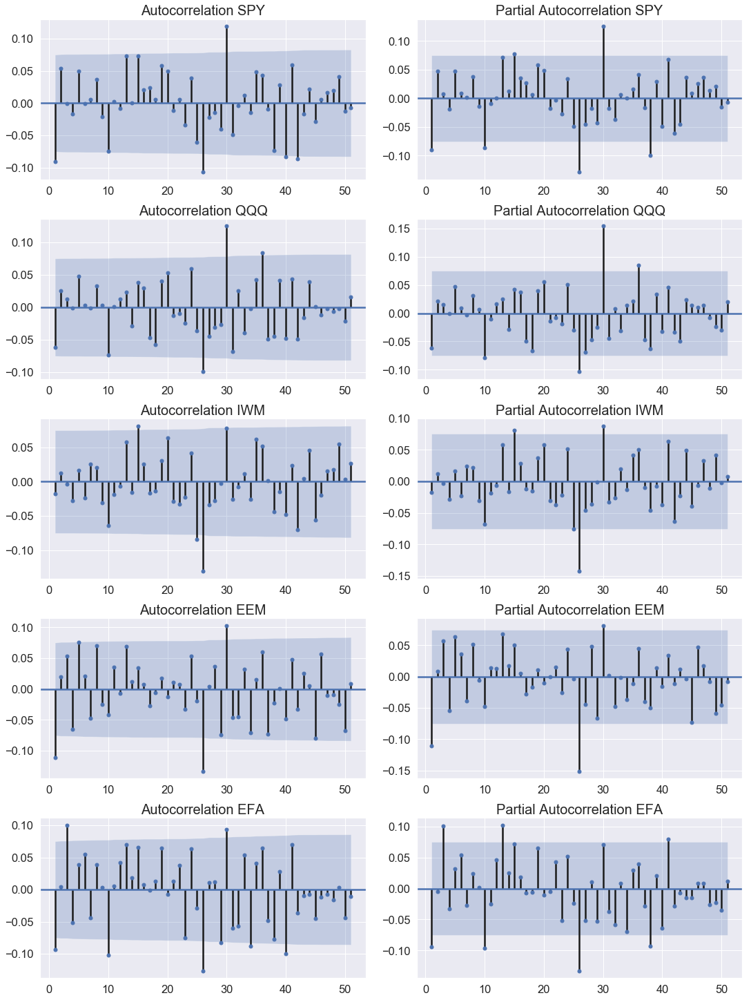

In [156]:
fig2 = plt.figure(constrained_layout=True)
spec2 = gridspec.GridSpec(ncols=2, nrows=5, figure=fig2)
fig2.set_figheight(20)
fig2.set_figwidth(15)
lags = np.arange(1,52)
pn = 0
for i in tickers[:]:
    f2_ax1 = fig2.add_subplot(spec2[pn, 0])
    plot_acf(df[df['ticker'] == i].iloc[::5, :]['rtnHv005'].dropna(), lags = lags, ax = f2_ax1)
    f2_ax1.set_title('Autocorrelation '+i, fontsize=20)
    
    f2_ax2 = fig2.add_subplot(spec2[pn, 1])
    plot_pacf(df[df['ticker'] == i].iloc[::5, :]['rtnHv005'].dropna(), lags = lags, ax = f2_ax2)
    f2_ax2.set_title('Partial Autocorrelation '+i, fontsize=20)
    pn += 1

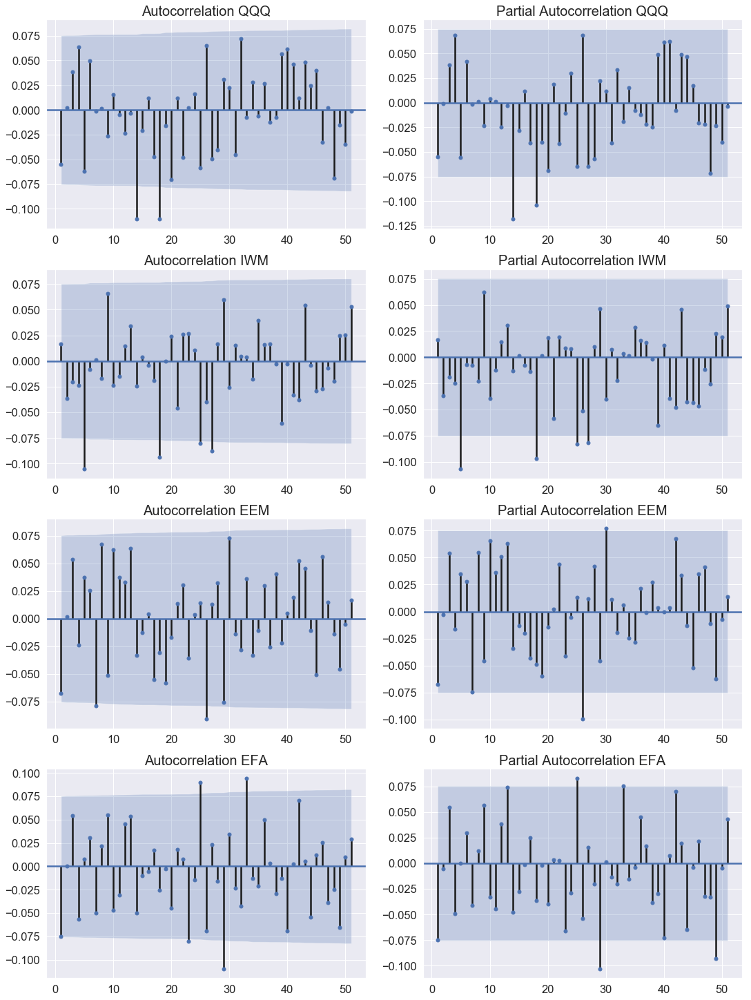

In [157]:
fig2 = plt.figure(constrained_layout=True)
spec2 = gridspec.GridSpec(ncols=2, nrows=4, figure=fig2)
fig2.set_figheight(20)
fig2.set_figwidth(15)
lags = np.arange(1,52)
pn = 0
for i in tickers[1:]:
    f2_ax1 = fig2.add_subplot(spec2[pn, 0])
    plot_acf(df[df['ticker'] == i].iloc[::5, :]['RelrtnHv005'].dropna(), lags = lags, ax = f2_ax1)
    f2_ax1.set_title('Autocorrelation '+i, fontsize=20)
    
    f2_ax2 = fig2.add_subplot(spec2[pn, 1])
    plot_pacf(df[df['ticker'] == i].iloc[::5, :]['RelrtnHv005'].dropna(), lags = lags, ax = f2_ax2)
    f2_ax2.set_title('Partial Autocorrelation '+i, fontsize=20)
    pn += 1

# Feature Creation & Data Merge
- Here we use various technical indicators on our return / price data
- below is the createFeatures function we use on both relative returns & absolute

In [473]:
[col for col in df.columns if 'rtnHv' in col]

['rtnHv001',
 'rtnHv002',
 'rtnHv003',
 'rtnHv004',
 'rtnHv005',
 'rtnHv010',
 'rtnHv021',
 'rtnHv042',
 'rtnHv063',
 'rtnHv126',
 'rtnHv252',
 'rtnHv512',
 'RelrtnHv001',
 'RelrtnHv002',
 'RelrtnHv003',
 'RelrtnHv004',
 'RelrtnHv005',
 'RelrtnHv010',
 'RelrtnHv021',
 'RelrtnHv042',
 'RelrtnHv063',
 'RelrtnHv126',
 'RelrtnHv252',
 'RelrtnHv512']

In [6]:
ficols = ['rtnHv252', 'rtnHv126', 'rtnHv021', 'rtnHv010', 
                  'iv252d', 'iv126d',
                  'hlHv010', 'hlHv126',
                  'tcreturn']
fidata = df[df['ticker'] == 'TLT'][ficols]
fidata['FIst6mRealized'] = fidata['hlHv010'] - fidata['hlHv126']
fidata['FIRet12m1m'] = fidata['rtnHv252'] -  fidata['rtnHv021']
fidata['FIRet3m2w'] = fidata['rtnHv126'] -  fidata['rtnHv010']
FI_FFD_df = fracDiff_FFD(fidata['tcreturn'], .5, 
                      thres=1e-2).to_frame().rename(columns={'tcreturn': "FIFF"})
fidata = fidata.merge(FI_FFD_df, how='left', left_index=True, right_index=True)
fidata['FIRSI14d'], fidata['FIRSIs14d']  = RSI(fidata['tcreturn'], window_length = 14, MA = 'S')
fidata = fidata.rename(columns={'iv252d': 'FIiv252d', 'iv126d': 'FIiv126d'})
fidata = fidata[['FIst6mRealized', 'FIRet12m1m', 'FIRet3m2w', 'FIFF', 'FIRSI14d', 'FIRSIs14d',
                 'FIiv252d', 'FIiv126d']]
print('FIXED', fidata.shape)

FIXED (3412, 8)


In [79]:
def createFeatures(df, tickers, cRetFld, dRetFld, dFrac, ids, drops, relF = False, 
                   ScaleF = True):
    if type(dFrac) not in [list, float]:
        raise Exception('wrong fractional degree of differentation input')
    if type(dFrac) == list:
        if len(tickers) != len(dFrac):
            raise Exception('dFrac shape != Tickers')
    mdata = pd.DataFrame([])
    c = 0
    
    # Fixed Income Applied to all
    ficols = ['rtnHv252', 'rtnHv126', 'rtnHv021', 'rtnHv010', 
                  'iv252d', 'iv126d',
                  'hlHv010', 'hlHv126',
                  'tcreturn']
    fidata = df[df['ticker'] == 'TLT'][ficols]
    fidata['FIst6mRealized'] = fidata['hlHv010'] - fidata['hlHv126']
    fidata['FIRet12m1m'] = fidata['rtnHv252'] -  fidata['rtnHv021']
    fidata['FIRet3m2w'] = fidata['rtnHv126'] -  fidata['rtnHv010']
    FI_FFD_df = fracDiff_FFD(fidata['tcreturn'], .5, 
                          thres=1e-2).to_frame().rename(columns={'tcreturn': "FIFF"})
    fidata = fidata.merge(FI_FFD_df, how='left', left_index=True, right_index=True)
    fidata['FIRSI14d'], fidata['FIRSIs14d']  = RSI(fidata['tcreturn'], window_length = 14, MA = 'S')
    fidata = fidata.rename(columns={'iv252d': 'FIiv252d', 'iv126d': 'FIiv126d'})
    fidata = fidata[['FIst6mRealized', 'FIRet12m1m', 'FIRet3m2w', 'FIFF', 'FIRSI14d', 'FIRSIs14d',
                     'FIiv252d', 'FIiv126d']]
    
    tmp = [x for x in list(df.columns) if x not in ids]
    tmp = [x for x in tmp if x not in drops]
    print(tmp)
    for t in tickers:
        tdata = df[df['ticker'] == t][tmp]
        tdf = df[df['ticker'] == t][cRetFld]
        ddf = df[df['ticker'] == t][dRetFld]
        dOHLC = df[df['ticker'] == t][['close', 'high', 'low', 'open']]
        FFD_df = fracDiff_FFD(df[df['ticker'] == t][cRetFld],
                              dFrac[c] if (type(dFrac)==list) else dFrac,
                              thres=1e-2).to_frame().rename(columns={cRetFld: "MeanRevFF"})
        # Create Signals
        tdata['TrendMASlope10'] = tdf.ewm(span=10).mean().diff().rolling(window=5, min_periods=5).mean()
        tdata['TrendMASlope50'] = tdf.ewm(span=50).mean().diff().rolling(window=5, min_periods=5).mean()
        tdata['TrendMASlope100'] = tdf.ewm(span=100).mean().diff().rolling(window=5, min_periods=5).mean()
        tdata['TrendMASlope200'] = tdf.ewm(span=200).mean().diff().rolling(window=5, min_periods=5).mean()
        tdata['MeanRevRSI14d'], tdata['TrendRSIs14d']  = RSI(tdf, window_length = 14, MA = 'S')
        tdata['MeanRevRSI63d'], tdata['TrendRSIs63d']  = RSI(tdf, window_length = 63, MA = 'S')
        tdata['TrendhBma'] = bollinger_hband_indicator(ddf, n = 20).ewm(span=50).mean()
        tdata['TrendlBma'] = (bollinger_lband_indicator(ddf, n = 20)*-1).ewm(span=50).mean()
        tdata['TrendabsBma'] = (tdata['TrendhBma'] - tdata['TrendlBma']).abs()
        tdata['aroon_up'] = aroon_up(tdf, n=50)
        tdata['aroon_down'] = aroon_down(tdf, n=50)
        tdata['aroon_diff'] = tdata['aroon_up'] - tdata['aroon_down']
        tdata['MACD_12_26'] = macd(tdf, n_fast=12, n_slow=26)
        tdata['MACD_diff'] = macd_diff(tdf, n_fast=12, n_slow=26, n_sign=9)
        tdata['MACD_sign'] =  macd_signal(tdf, n_fast=12, n_slow=26, n_sign=9) 
        tdata['MACD_36_78'] = macd(tdf, n_fast=36, n_slow=78)
        tdata['MACD_sign3x'] =  macd_signal(tdf, n_fast=36, n_slow=78, n_sign=27) 
        tdata = tdata.merge(FFD_df, how='left', left_index=True, right_index=True)
        tdata['MeanRevFFEWMA1'] = tdata['MeanRevFF'].ewm(span=20).mean()
        tdata['MeanRevFFEWMA2'] = tdata['MeanRevFF'].ewm(span=200).mean()
        tdata['MeanRevFFDiff'] =  tdata['MeanRevFF'] - tdata['MeanRevFFEWMA1']
        # Vol Features
        tdata['st6mRealized'] = tdata['hlHv010'] - tdata['hlHv126']
        tdata['st6mIV'] = tdata['iv010d'] - tdata['iv126d'] 
        tdata['IVRV3Mhl'] = tdata['iv063d'] - tdata['hlHv063']*np.sqrt(252)
        tdata['IVRV3Mcc'] = tdata['iv063d'] - tdata['ccHv063']*np.sqrt(252)
        # Return Momentum Features
        tdata['Ret12m1m'] = tdata['rtnHv252'] -  tdata['rtnHv021']
        tdata['Ret12m6m'] = tdata['rtnHv252'] -  tdata['rtnHv126']
        tdata['Ret6m1m'] = tdata['rtnHv126'] -  tdata['rtnHv021']
        tdata['Ret6m2w'] = tdata['rtnHv126'] -  tdata['rtnHv010']
        tdata['Ret3m2w'] = tdata['rtnHv126'] -  tdata['rtnHv010']
        # Fixed Income Features
        tdata = tdata.merge(fidata, how='left', left_index=True, right_index=True)        
        tdata['USGG10Yr2Yr'] = tdata['USGG10YR'] - tdata['USGG2YR']
        tdata['USGG10Yr3M'] = tdata['USGG10YR'] - tdata['USGG3M']
        tdata['USGG10YR_s'] = tdata['USGG10YR'].diff().ewm(span=20).mean()
        tdata['MOODCBAA_s'] = tdata['MOODCBAA'].ewm(span=20).mean().diff().rolling(window=5, min_periods=1).mean()
        tdata['USGG10Yr2Yr_s'] = tdata['USGG10Yr2Yr'].diff().ewm(span=20).mean()

        unscaled_feat=[]
        if relF == True:
            unscaled_feat += ['RelRet12m1m', 'Rel10d6mRealized', 'reliv063d_SPY'] 
            tdata['RelRet12m1m'] = tdata['RelrtnHv252'] -  tdata['RelrtnHv021']
            tdata['RelRet12m6m'] = tdata['RelrtnHv252'] -  tdata['RelrtnHv126']
            tdata['RelRet6m1m'] = tdata['RelrtnHv126'] -  tdata['RelrtnHv021']
            tdata['RelRet6m2w'] = tdata['RelrtnHv126'] -  tdata['RelrtnHv010']
            tdata['RelRet3m2w'] = tdata['RelrtnHv126'] -  tdata['RelrtnHv010']
            tdata['RelccHv010'] = tdata['RelrtnHv010'].rolling(window=10, min_periods=1).std()
            tdata['RelccHv021'] = tdata['RelrtnHv021'].rolling(window=21, min_periods=1).std()
            tdata['RelccHv063'] = tdata['RelrtnHv063'].rolling(window=63, min_periods=1).std()
            tdata['RelccHv126'] = tdata['RelrtnHv126'].rolling(window=126, min_periods=1).std()
            tdata['RelccHv252'] = tdata['RelrtnHv252'].rolling(window=252, min_periods=1).std()
            tdata['Rel10d6mRealized'] = tdata['RelccHv010'] - tdata['RelccHv126']
            tdata['reliv063d_SPY'] = tdata['iv063d'] - df[df['ticker'] == 'SPY']['iv063d']
        
        cols = list(tdata.columns)
        tdata = tdata.dropna()
        scaler = MinMaxScaler() #MinMaxScaler StandardScaler
        if ScaleF == True:
            unscaled_feat += ['IVRV3Mhl', 'iv063d', 'hlHv063'] 
            _unscl = tdata[unscaled_feat]   
            _unscl.columns += '_nN'                                   
            tdata[cols] = scaler.fit_transform(tdata)
            tdata = pd.concat([tdata,_unscl], axis=1)                         
            
        tdata['ticker'] = t
        tdata['period'] = df[df['ticker'] == t]['period']
        mdata = mdata.append(tdata, ignore_index=True)
        c+=1

    mdata = mdata.merge(df[ids], on=['period', 'ticker'], how='left')
    mdata.index = mdata['period']

    # Melt
    mmdata = pd.melt(mdata, 
                      id_vars=ids, 
                      value_vars=[x for x in list(mdata.columns) if x not in ids])
    
    return mdata, mmdata

In [8]:
Fvret_window = [col for col in df.columns if 'rtnFv' in col]
for i in Fvret_window:
    df['Side'+i] = np.where(df[i] > 0, 1, -1)

retwindow = 'rtnFv063'
cols = ['ticker', 'period', 'dn', 'open', 'high', 'low', 'close',
         retwindow, 'Side'+retwindow, 'ccRtn', 'tcreturn', 'rtnFv001',
        'iv010d', 'iv021d','iv063d','iv126d','iv252d',
        'hlHv010','hlHv021', 'hlHv063','hlHv126',
        'ccHv010', 'ccHv021','ccHv063',
        'rtnHv005', 'rtnHv010', 'rtnHv021', 'rtnHv063', 'rtnHv126', 'rtnHv252',
        'MOVE', 'USGG2YR', 'USGG3M', 'USGG10YR', 'MOODCBAA']
sides = df[cols]

#for column in sides:
 #   if sides[column].isnull().any():
  #      print('{0} has {1} null values'.format(column, sides[column].isnull().sum()))
sides = sides.dropna()
scaler = MinMaxScaler()
sides['forwardmmS'] = scaler.fit_transform(sides[retwindow].values.reshape(-1,1))
scaler = StandardScaler()
sides['forwardstdS'] = scaler.fit_transform(sides[retwindow].values.reshape(-1,1))
sides.index = sides['period']
#sides.head()

In [74]:
fnlist = ['period', 'ticker', 'forwardmmS', 'forwardstdS', retwindow, 'Side'+retwindow, 'ccRtn', 'rtnFv001']
drops = ['open', 'high', 'low', 'close','ccRtn', 'rtnFv001', 'tcreturn', 'dn']
mdata, mmdata = createFeatures(sides,  tickers[:-1], 'tcreturn', 'ccRtn', .5, fnlist, drops)

['iv010d', 'iv021d', 'iv063d', 'iv126d', 'iv252d', 'hlHv010', 'hlHv021', 'hlHv063', 'hlHv126', 'ccHv010', 'ccHv021', 'ccHv063', 'rtnHv005', 'rtnHv010', 'rtnHv021', 'rtnHv063', 'rtnHv126', 'rtnHv252', 'MOVE', 'USGG2YR', 'USGG3M', 'USGG10YR', 'MOODCBAA']


C:\ProgramData\Anaconda3\lib\site-packages\ta\trend.py:503: FutureWarning:

Currently, 'apply' passes the values as ndarrays to the applied function. In the future, this will change to passing it as Series objects. You need to specify 'raw=True' to keep the current behaviour, and you can pass 'raw=False' to silence this warning

C:\ProgramData\Anaconda3\lib\site-packages\ta\trend.py:525: FutureWarning:

Currently, 'apply' passes the values as ndarrays to the applied function. In the future, this will change to passing it as Series objects. You need to specify 'raw=True' to keep the current behaviour, and you can pass 'raw=False' to silence this warning

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:88: FutureWarning:

'period' is both an index level and a column label.
Defaulting to column, but this will raise an ambiguity error in a future version



In [75]:
mdata.columns

Index(['iv010d', 'iv021d', 'iv063d', 'iv126d', 'iv252d', 'hlHv010', 'hlHv021',
       'hlHv063', 'hlHv126', 'ccHv010', 'ccHv021', 'ccHv063', 'rtnHv005',
       'rtnHv010', 'rtnHv021', 'rtnHv063', 'rtnHv126', 'rtnHv252', 'MOVE',
       'USGG2YR', 'USGG3M', 'USGG10YR', 'MOODCBAA', 'TrendMASlope10',
       'TrendMASlope50', 'TrendMASlope100', 'TrendMASlope200', 'MeanRevRSI14d',
       'TrendRSIs14d', 'MeanRevRSI63d', 'TrendRSIs63d', 'TrendhBma',
       'TrendlBma', 'TrendabsBma', 'aroon_up', 'aroon_down', 'aroon_diff',
       'MACD_12_26', 'MACD_diff', 'MACD_sign', 'MACD_36_78', 'MACD_sign3x',
       'MeanRevFF', 'MeanRevFFEWMA1', 'MeanRevFFEWMA2', 'MeanRevFFDiff',
       'st6mRealized', 'st6mIV', 'IVRV3Mhl', 'IVRV3Mcc', 'Ret12m1m',
       'Ret12m6m', 'Ret6m1m', 'Ret6m2w', 'Ret3m2w', 'FIst6mRealized',
       'FIRet12m1m', 'FIRet3m2w', 'FIFF', 'FIRSI14d', 'FIRSIs14d', 'FIiv252d',
       'FIiv126d', 'USGG10Yr2Yr', 'USGG10Yr3M', 'USGG10YR_s', 'MOODCBAA_s',
       'USGG10Yr2Yr_s', 'ticker', '

In [76]:
print(mdata.shape)
print(mmdata['variable'].unique())
mmdata.head()

(14330, 76)
['iv010d' 'iv021d' 'iv063d' 'iv126d' 'iv252d' 'hlHv010' 'hlHv021'
 'hlHv063' 'hlHv126' 'ccHv010' 'ccHv021' 'ccHv063' 'rtnHv005' 'rtnHv010'
 'rtnHv021' 'rtnHv063' 'rtnHv126' 'rtnHv252' 'MOVE' 'USGG2YR' 'USGG3M'
 'USGG10YR' 'MOODCBAA' 'TrendMASlope10' 'TrendMASlope50' 'TrendMASlope100'
 'TrendMASlope200' 'MeanRevRSI14d' 'TrendRSIs14d' 'MeanRevRSI63d'
 'TrendRSIs63d' 'TrendhBma' 'TrendlBma' 'TrendabsBma' 'aroon_up'
 'aroon_down' 'aroon_diff' 'MACD_12_26' 'MACD_diff' 'MACD_sign'
 'MACD_36_78' 'MACD_sign3x' 'MeanRevFF' 'MeanRevFFEWMA1' 'MeanRevFFEWMA2'
 'MeanRevFFDiff' 'st6mRealized' 'st6mIV' 'IVRV3Mhl' 'IVRV3Mcc' 'Ret12m1m'
 'Ret12m6m' 'Ret6m1m' 'Ret6m2w' 'Ret3m2w' 'FIst6mRealized' 'FIRet12m1m'
 'FIRet3m2w' 'FIFF' 'FIRSI14d' 'FIRSIs14d' 'FIiv252d' 'FIiv126d'
 'USGG10Yr2Yr' 'USGG10Yr3M' 'USGG10YR_s' 'MOODCBAA_s' 'USGG10Yr2Yr_s']


,period,ticker,forwardmmS,forwardstdS,rtnFv063,SidertnFv063,ccRtn,rtnFv001,variable,value
0,2007-06-04,SPY,0.559053,-0.566801,-0.000617,-1,0.000130,-0.003966,iv010d,0.086089
1,2007-06-07,SPY,0.586380,-0.188969,-0.000036,-1,-0.018210,0.012927,iv010d,0.120360
2,2007-06-08,SPY,0.566292,-0.466712,-0.000463,-1,0.012927,0.001720,iv010d,0.100022
3,2007-06-11,SPY,0.563578,-0.504234,-0.000521,-1,0.001720,-0.010966,iv010d,0.099287
4,2007-06-12,SPY,0.580405,-0.271581,-0.000163,-1,-0.010966,0.014857,iv010d,0.112980


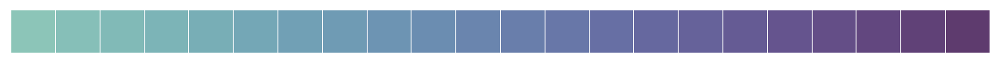

In [41]:
cmap = sns.cubehelix_palette(22, start=1,rot=-.80, dark = .3, light=.7)
sns.palplot(cmap)

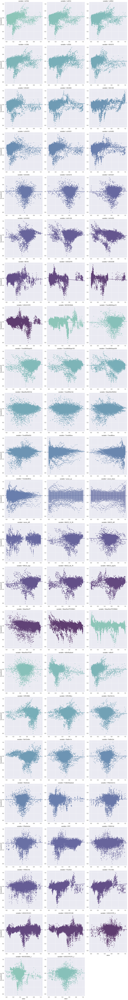

In [42]:
sns.set_style("darkgrid")
sns.set(rc={'figure.figsize':(40,40)})
sns.set_context("notebook", font_scale=1.5, rc={"lines.linewidth": 2.5})
g = sns.FacetGrid(mmdata, col="variable", hue="variable",
                  palette=cmap,
                  height = 8, 
                  col_wrap = 3,
                  sharex=False, 
                  sharey=False,
                  margin_titles=True)
g.map(sns.regplot,'value', 'forwardmmS')
g.savefig('plots/AbsoluteReturnsScatterPlots-3M.png')

In [43]:
df_stats = pd.DataFrame([], columns = ['pval', 'rsquared', 'coef'])
for i in mmdata.variable.unique():
    form = "forwardmmS ~ "+str(i)
    model = ols(form, mdata).fit()
    df_stats.loc[i, :] = [np.round(model.pvalues[1],4), 
                              np.round(model.rsquared, 4), 
                              np.round(model.params[1],3)]

df_stats.sort_values(by=['rsquared'], ascending = False)

,pval,rsquared,coef
USGG10YR,0,0.051,-0.093
USGG2YR,0,0.0396,-0.082
FIiv126d,0,0.0323,0.093
st6mRealized,0,0.0314,-0.15
FIiv252d,0,0.0304,0.094
MOODCBAA_s,0,0.0266,-0.165
MeanRevFFEWMA2,0,0.0252,-0.044
hlHv126,0,0.0231,0.061
rtnHv063,0,0.0201,0.107
FIFF,0,0.0188,0.05


# Relative Return Features Plot / T Stat

- Below We made the Same plot/Output for Relative to SPY returns

In [73]:
rretwindow = 'RelrtnFv063'
cols = ['ticker', 'period', 'dn', 'open', 'high', 'low', 'close',
        rretwindow, 'Side'+rretwindow, 'RelccRtn', 'rtnFv001', 'tcrreturn', 'tcreturn',
        'iv010d', 'iv021d','iv063d','iv126d','iv252d',
        'hlHv010','hlHv021', 'hlHv063','hlHv126',
        'ccHv010', 'ccHv021','ccHv063',
        'rtnHv005', 'rtnHv010', 'rtnHv021', 'rtnHv063', 'rtnHv126', 'rtnHv252',
        'RelrtnHv010', 'RelrtnHv021', 'RelrtnHv063','RelrtnHv126','RelrtnHv252',
        'MOVE', 'USGG2YR', 'USGG3M', 'USGG10YR', 'MOODCBAA']
sides = df[cols]

#for column in sides:
 #   if sides[column].isnull().any():
  #      print('{0} has {1} null values'.format(column, sides[column].isnull().sum()))
sides = sides.dropna()
scaler = MinMaxScaler()
sides['forwardmmS'] = scaler.fit_transform(sides[rretwindow].values.reshape(-1,1))
scaler = StandardScaler()
sides['forwardstdS'] = scaler.fit_transform(sides[rretwindow].values.reshape(-1,1))
sides.index = sides['period']
sides.head()

,ticker,period,dn,open,high,low,close,RelrtnFv063,SideRelrtnFv063,RelccRtn,...,RelrtnHv063,RelrtnHv126,RelrtnHv252,MOVE,USGG2YR,USGG3M,USGG10YR,MOODCBAA,forwardmmS,forwardstdS
period,,,,,,,,,,,,,,,,,,,,,
2007-01-04,IWM,2007-01-04,2775,77.889999,78.589996,77.279999,78.370003,0.000096,1,0.000564,...,0.000538,-0.000163,0.000089,72.0,4.6913,5.0297,4.6024,6.24,0.419428,0.154648
2007-01-05,IWM,2007-01-05,2776,78.019997,78.366302,76.699997,76.730003,0.000308,1,-0.013140,...,0.000133,-0.000242,0.000034,67.4,4.7494,5.0380,4.6442,6.25,0.431269,0.356545
2007-01-08,IWM,2007-01-08,2777,76.949997,77.300003,76.230003,76.430000,0.000470,1,-0.008532,...,-0.000173,-0.000243,-0.000019,64.3,4.7744,5.0477,4.6522,6.25,0.440310,0.510688
2007-01-09,IWM,2007-01-09,2778,77.120003,77.309998,76.190002,77.150002,0.000274,1,0.010226,...,0.000051,-0.000148,0.000008,61.8,4.7912,5.0727,4.6542,6.25,0.429375,0.324249
2007-01-10,IWM,2007-01-10,2779,76.760002,77.750000,76.570000,77.750000,0.000240,1,0.004420,...,0.000010,-0.000147,0.000009,62.2,4.8080,5.0823,4.6843,6.28,0.427469,0.291747


In [80]:
fnlist = ['period', 'ticker', 'forwardmmS', 'forwardstdS', 
          rretwindow, 'Side'+rretwindow, 'RelccRtn', 'rtnFv001']
drops = ['open', 'high', 'low', 'close', 'RelccRtn', rretwindow, 
         'tcrreturn', 'tcreturn', 'rtnFv001', 'dn']
mdatar, mmdatar = createFeatures(sides,  tickers[1:-1], 'tcrreturn', 'RelccRtn', 
                                 [0.5,0.2,.5,.5], fnlist, drops, relF = True, ScaleF = True)

print(mdatar.shape)
print(mmdatar['variable'].unique())
mmdatar.head()

['iv010d', 'iv021d', 'iv063d', 'iv126d', 'iv252d', 'hlHv010', 'hlHv021', 'hlHv063', 'hlHv126', 'ccHv010', 'ccHv021', 'ccHv063', 'rtnHv005', 'rtnHv010', 'rtnHv021', 'rtnHv063', 'rtnHv126', 'rtnHv252', 'RelrtnHv010', 'RelrtnHv021', 'RelrtnHv063', 'RelrtnHv126', 'RelrtnHv252', 'MOVE', 'USGG2YR', 'USGG3M', 'USGG10YR', 'MOODCBAA']


C:\ProgramData\Anaconda3\lib\site-packages\ta\trend.py:503: FutureWarning:

Currently, 'apply' passes the values as ndarrays to the applied function. In the future, this will change to passing it as Series objects. You need to specify 'raw=True' to keep the current behaviour, and you can pass 'raw=False' to silence this warning

C:\ProgramData\Anaconda3\lib\site-packages\ta\trend.py:525: FutureWarning:

Currently, 'apply' passes the values as ndarrays to the applied function. In the future, this will change to passing it as Series objects. You need to specify 'raw=True' to keep the current behaviour, and you can pass 'raw=False' to silence this warning

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:111: FutureWarning:

'period' is both an index level and a column label.
Defaulting to column, but this will raise an ambiguity error in a future version



(11490, 99)
['iv010d' 'iv021d' 'iv063d' 'iv126d' 'iv252d' 'hlHv010' 'hlHv021'
 'hlHv063' 'hlHv126' 'ccHv010' 'ccHv021' 'ccHv063' 'rtnHv005' 'rtnHv010'
 'rtnHv021' 'rtnHv063' 'rtnHv126' 'rtnHv252' 'RelrtnHv010' 'RelrtnHv021'
 'RelrtnHv063' 'RelrtnHv126' 'RelrtnHv252' 'MOVE' 'USGG2YR' 'USGG3M'
 'USGG10YR' 'MOODCBAA' 'TrendMASlope10' 'TrendMASlope50' 'TrendMASlope100'
 'TrendMASlope200' 'MeanRevRSI14d' 'TrendRSIs14d' 'MeanRevRSI63d'
 'TrendRSIs63d' 'TrendhBma' 'TrendlBma' 'TrendabsBma' 'aroon_up'
 'aroon_down' 'aroon_diff' 'MACD_12_26' 'MACD_diff' 'MACD_sign'
 'MACD_36_78' 'MACD_sign3x' 'MeanRevFF' 'MeanRevFFEWMA1' 'MeanRevFFEWMA2'
 'MeanRevFFDiff' 'st6mRealized' 'st6mIV' 'IVRV3Mhl' 'IVRV3Mcc' 'Ret12m1m'
 'Ret12m6m' 'Ret6m1m' 'Ret6m2w' 'Ret3m2w' 'FIst6mRealized' 'FIRet12m1m'
 'FIRet3m2w' 'FIFF' 'FIRSI14d' 'FIRSIs14d' 'FIiv252d' 'FIiv126d'
 'USGG10Yr2Yr' 'USGG10Yr3M' 'USGG10YR_s' 'MOODCBAA_s' 'USGG10Yr2Yr_s'
 'RelRet12m1m' 'RelRet12m6m' 'RelRet6m1m' 'RelRet6m2w' 'RelRet3m2w'
 'RelccHv010' 

,period,ticker,forwardmmS,forwardstdS,RelrtnFv063,SideRelrtnFv063,RelccRtn,rtnFv001,variable,value
0,2007-06-04,QQQ,0.472911,1.066526,0.001054,1,0.002819,-0.000002,iv010d,0.102581
1,2007-06-07,QQQ,0.468735,0.995324,0.000979,1,0.002577,0.012228,iv010d,0.132065
2,2007-06-08,QQQ,0.465202,0.935083,0.000916,1,-0.000699,-0.001921,iv010d,0.114058
3,2007-06-11,QQQ,0.469575,1.009643,0.000994,1,-0.003640,-0.005998,iv010d,0.111914
4,2007-06-12,QQQ,0.468219,0.986536,0.000970,1,0.004968,0.010898,iv010d,0.123467


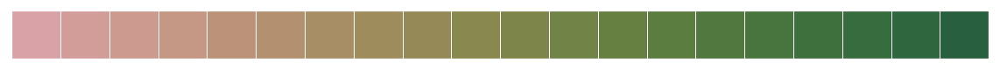

In [66]:
cmap = sns.cubehelix_palette(20, start=15, rot=-1.00, dark = .3, light=.7)
sns.palplot(cmap)

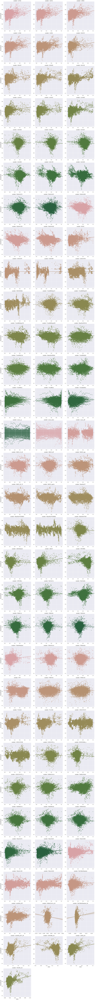

In [68]:
sns.set_style("darkgrid")
sns.set(rc={'figure.figsize':(40,40)})
sns.set_context("notebook", font_scale=1.5, rc={"lines.linewidth": 2.5})

g = sns.FacetGrid(mmdatar, col="variable", hue="variable",
                  palette=cmap,
                  height = 8, 
                  col_wrap = 3,
                  sharex=False, 
                  sharey=False,
                  margin_titles=True)
g.map(sns.regplot,'value','forwardmmS')

g.savefig('plots/RelativeReturnsScatterPlots-3M.png')

In [67]:
df_stats = pd.DataFrame([], columns = ['pval', 'rsquared', 'coef'])
for i in mmdatar.variable.unique():
    form = "forwardmmS ~ "+str(i)
    model = ols(form, mdatar).fit() #[mdatar['ticker'] == 'EEM']
    df_stats.loc[i, :] = [np.round(model.pvalues[1],4), 
                              np.round(model.rsquared, 4), 
                              np.round(model.params[1],3)]
    
df_stats.sort_values(by=['rsquared'], ascending = False)

,pval,rsquared,coef
ccHv063,0,0.0703,0.084
hlHv063_nN,0,0.0672,1.23
hlHv063,0,0.0664,0.079
hlHv126,0,0.0635,0.063
iv063d_nN,0,0.0576,0.117
iv126d,0,0.057,0.072
iv063d,0,0.056,0.077
iv021d,0,0.0532,0.079
iv010d,0,0.0523,0.08
iv252d,0,0.05,0.061


In [83]:
#mdata.to_csv('mdata.csv')
mdatar.to_csv('mdatar.csv')

In [82]:
mdatar.columns

Index(['iv010d', 'iv021d', 'iv063d', 'iv126d', 'iv252d', 'hlHv010', 'hlHv021',
       'hlHv063', 'hlHv126', 'ccHv010', 'ccHv021', 'ccHv063', 'rtnHv005',
       'rtnHv010', 'rtnHv021', 'rtnHv063', 'rtnHv126', 'rtnHv252',
       'RelrtnHv010', 'RelrtnHv021', 'RelrtnHv063', 'RelrtnHv126',
       'RelrtnHv252', 'MOVE', 'USGG2YR', 'USGG3M', 'USGG10YR', 'MOODCBAA',
       'TrendMASlope10', 'TrendMASlope50', 'TrendMASlope100',
       'TrendMASlope200', 'MeanRevRSI14d', 'TrendRSIs14d', 'MeanRevRSI63d',
       'TrendRSIs63d', 'TrendhBma', 'TrendlBma', 'TrendabsBma', 'aroon_up',
       'aroon_down', 'aroon_diff', 'MACD_12_26', 'MACD_diff', 'MACD_sign',
       'MACD_36_78', 'MACD_sign3x', 'MeanRevFF', 'MeanRevFFEWMA1',
       'MeanRevFFEWMA2', 'MeanRevFFDiff', 'st6mRealized', 'st6mIV', 'IVRV3Mhl',
       'IVRV3Mcc', 'Ret12m1m', 'Ret12m6m', 'Ret6m1m', 'Ret6m2w', 'Ret3m2w',
       'FIst6mRealized', 'FIRet12m1m', 'FIRet3m2w', 'FIFF', 'FIRSI14d',
       'FIRSIs14d', 'FIiv252d', 'FIiv126d', 'USGG10Yr2

In [81]:
'''
cols = list(mmdata['variable'].unique())
with open('fnames.txt', 'w') as f:
    for s in cols:
        f.write(s + '\n')
'''
cols = list(mmdatar['variable'].unique())
with open('fnamesR.txt', 'w') as f:
    for s in cols:
        f.write(s + '\n')

In [37]:
!jupyter nbconvert --to html EDA_s0.ipynb

[NbConvertApp] Converting notebook EDA_s0.ipynb to html
[NbConvertApp] Writing 15601814 bytes to EDA_s0.html
